In [1]:
import sys
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
from shapely.geometry import Point
import geopandas as gpd
import re

blight_violation = pd.read_csv('_97bd1c1e5df9537bb13398c9898deed7_detroit-blight-violations.csv', index_col='TicketID', infer_datetime_format=True, parse_dates=['TicketIssuedDT'])
blight_violation.head()


/home/alex/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (6,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,TicketNumber,AgencyName,ViolName,ViolationStreetNumber,ViolationStreetName,MailingStreetNumber,MailingStreetName,MailingCity,MailingState,MailingZipCode,...,AdminFee,LateFee,StateFee,CleanUpCost,JudgmentAmt,PaymentStatus,Void,ViolationCategory,ViolationAddress,MailingAddress
TicketID,,,,,,,,,,,,,,,,,,,,,
26288,05000001DAH,Department of Public Works,"Group, LLC, Grand Holding",2566,GRAND BLVD,743,"Beaubien, Ste. 201",Detroit,MI,48226,...,$20.00,$150.00,$10.00,$0.00,$1680.00,PAID IN FULL,0.0,0,"2566 GRAND BLVD\nDetroit, MI\n(42.363182370000...","743 Beaubien\nDetroit, MI 48226\n(42.333730630..."
19800,05000025DAH,Department of Public Works,"JACKSON, RAECHELLE",19014,ASHTON,20501,HEYDEN,DETROIT,MI,48219,...,$20.00,$10.00,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"19014 ASHTON\nDetroit, MI\n(42.429390762000025...","20501 HEYDEN\nDETROIT, MI 48219\n(42.442177633..."
19804,05000026DAH,Department of Public Works,"TALTON, CAROL ANN",18735,STAHELIN,18735,STAHELI N,DETROIT,MI,48219,...,$20.00,$10.00,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"18735 STAHELIN\nDetroit, MI\n(42.4287074590000...","18735 STAHELI N\nDETROIT, MI 48219\n(42.428707..."
20208,05000027DAH,Department of Public Works,"BONNER, DARRYL E.",20125,MONICA,25335,PEEKSKILL,SOUTHFIELD,MI,48043,...,$20.00,$10.00,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"20125 MONICA\nDetroit, MI\n(42.44169828400004,...","25335 PEEKSKILL\nSOUTHFIELD, MI 48043\n(42.475..."
20211,05000028DAH,Department of Public Works,"GREGORY, JAMES LEE",17397,PRAIRIE,17397,PRAIRIE,DETROIT,MI,48221,...,$20.00,$10.00,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"17397 PRAIRIE\nDetroit, MI\n(42.42031769500005...","17397 PRAIRIE\nDETROIT, MI 48221\n(42.42031769..."


In [2]:
detroit_parcels_file = 'geo_export_298e035b-710a-45a8-9a61-1634018e07b6.shp'
parcels = gpd.read_file(detroit_parcels_file)
parcels.head(3)

,address,bldg_style,councildis,depth,flr_area,frontage,hmstd_pre,imp_value,land_value,landmap,...,sqft,tax_status,taxpayer,total_acre,txbl_val,ward,yr_built,zip_code,zoning,geometry
0,421 E CONGRESS,None,5,138.0,0.0,30.0,0.0,0.0,423409.0,356,...,4131.0,TAXABLE,"CONGRESS REI, LLC.",0.095,214400.0,01,0.0,48226,B6,POLYGON ((-83.04186410314239 42.33242643461565...
1,405 GRATIOT,None,5,0.0,0.0,0.0,0.0,0.0,1415755.0,357,...,16462.0,TAXABLE,MHT FAMILY PROPERTIES IV LLC,0.378,718700.0,01,0.0,48226,B4,POLYGON ((-83.04499168856273 42.33651153786033...
2,2527 JOHN R 25,None,6,0.0,0.0,0.0,0.0,0.0,22000.0,358,...,0.0,TAXABLE,"AZUH, OGCOCHKWU",0.000,11000.0,01,0.0,None,PD,POLYGON ((-83.05142580720801 42.34216118996503...


In [3]:
crs = parcels.crs #{'init': 'epsg:4326'}
crs

{'init': 'epsg:4326'}

In [4]:
blight_violation['TicketIssuedDT'] = pd.to_datetime(blight_violation['TicketIssuedDT'], errors='coerce')

coordina = blight_violation['ViolationAddress'].str.extract(r'\(([-+]{0,1}\d+\.\d+), ([-+]{0,1}\d+\.\d+)\)').astype('float', errors='ignore')
coordina['coo'] = coordina.apply(lambda x: Point(x[1], x[0]), axis=1)
blight_violation_geo = gpd.GeoDataFrame(blight_violation, crs=crs, geometry = coordina.coo)

blight_violation_geo.head()

,TicketNumber,AgencyName,ViolName,ViolationStreetNumber,ViolationStreetName,MailingStreetNumber,MailingStreetName,MailingCity,MailingState,MailingZipCode,...,LateFee,StateFee,CleanUpCost,JudgmentAmt,PaymentStatus,Void,ViolationCategory,ViolationAddress,MailingAddress,geometry
TicketID,,,,,,,,,,,,,,,,,,,,,
26288,05000001DAH,Department of Public Works,"Group, LLC, Grand Holding",2566,GRAND BLVD,743,"Beaubien, Ste. 201",Detroit,MI,48226,...,$150.00,$10.00,$0.00,$1680.00,PAID IN FULL,0.0,0,"2566 GRAND BLVD\nDetroit, MI\n(42.363182370000...","743 Beaubien\nDetroit, MI 48226\n(42.333730630...",POINT (-83.09167672099994 42.36318237000006)
19800,05000025DAH,Department of Public Works,"JACKSON, RAECHELLE",19014,ASHTON,20501,HEYDEN,DETROIT,MI,48219,...,$10.00,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"19014 ASHTON\nDetroit, MI\n(42.429390762000025...","20501 HEYDEN\nDETROIT, MI 48219\n(42.442177633...",POINT (-83.22039357799997 42.42939076200003)
19804,05000026DAH,Department of Public Works,"TALTON, CAROL ANN",18735,STAHELIN,18735,STAHELI N,DETROIT,MI,48219,...,$10.00,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"18735 STAHELIN\nDetroit, MI\n(42.4287074590000...","18735 STAHELI N\nDETROIT, MI 48219\n(42.428707...",POINT (-83.22754809599996 42.42870745900007)
20208,05000027DAH,Department of Public Works,"BONNER, DARRYL E.",20125,MONICA,25335,PEEKSKILL,SOUTHFIELD,MI,48043,...,$10.00,$10.00,$0.00,$140.00,NO PAYMENT APPLIED,0.0,0,"20125 MONICA\nDetroit, MI\n(42.44169828400004,...","25335 PEEKSKILL\nSOUTHFIELD, MI 48043\n(42.475...",POINT (-83.14501821599998 42.44169828400004)
20211,05000028DAH,Department of Public Works,"GREGORY, JAMES LEE",17397,PRAIRIE,17397,PRAIRIE,DETROIT,MI,48221,...,$10.00,$10.00,$0.00,$140.00,PAID IN FULL,0.0,0,"17397 PRAIRIE\nDetroit, MI\n(42.42031769500005...","17397 PRAIRIE\nDETROIT, MI 48221\n(42.42031769...",POINT (-83.14532817999998 42.42031769500005)


In [5]:
detroit_311 = pd.read_csv('_dcebfb2135a2bf5a6392493bd61aba22_detroit-311.csv', index_col='ticket_id', infer_datetime_format=True, parse_dates=['ticket_closed_date_time', 'ticket_created_date_time'])
detroit_311.head()

,city,issue_type,ticket_status,issue_description,rating,ticket_closed_date_time,acknowledged_at,ticket_created_date_time,ticket_last_updated_date_time,address,lat,lng,location,image
ticket_id,,,,,,,,,,,,,,
1516722,City of Detroit,Clogged Drain,Acknowledged,"Two drains one on each side of street, street ...",3,NaT,03/06/2015 10:03:38 PM,2015-03-06 21:57:52,04/12/2015 01:01:10 AM,"13120-13130 Ilene Street Detroit, MI 48238, USA",42.383998,-83.161039,"(42.3839977668, -83.1610385642)",NaN
1525361,City of Detroit,Clogged Drain,Acknowledged,standing water on lumplin,2,NaT,03/11/2015 04:23:11 PM,2015-03-11 16:14:29,04/07/2015 02:04:44 PM,"1485 E. Outer Drive Detroit, Michigan",42.440471,-83.080919,"(42.4404708, -83.080919)",NaN
1525218,City of Detroit,Clogged Drain,Closed,CITZEN CALLED TO REPORT CLOGGED DRAINS,2,2015-08-15 00:03:43,03/11/2015 03:39:05 PM,2015-03-11 15:26:20,08/15/2015 12:03:44 AM,"15460 Eastburn Detroit, Michigan",42.445244,-82.962038,"(42.445244, -82.962038)",NaN
1525214,City of Detroit,Clogged Drain,Acknowledged,Citizen called DWSD to report clogged drain,3,NaT,03/11/2015 03:35:02 PM,2015-03-11 15:22:42,06/07/2015 10:07:48 PM,"17541 Mendota St Detroit, Michigan",42.421043,-83.166194,"(42.421043, -83.166194)",NaN
1525142,City of Detroit,Clogged Drain,Acknowledged,@ THE CORNER OF GRIGGS & MARGARETA,2,NaT,03/11/2015 03:04:59 PM,2015-03-11 14:53:23,03/11/2015 03:04:59 PM,"Griggs Detroit, Michigan",42.402033,-83.162874,"(42.4020334, -83.1628741)",NaN


In [6]:
#detroit_311.info()
detroit_311['coord'] = detroit_311.apply(lambda x: Point(x.lng, x.lat), axis=1)
detroit_311_geo = gpd.GeoDataFrame(detroit_311, crs=crs, geometry = detroit_311.coord)
detroit_311_geo['geometry'].head()

ticket_id
1516722    POINT (-83.16103856417159 42.3839977668242)
1525361          POINT (-83.08091899999999 42.4404708)
1525218           POINT (-82.96203800000001 42.445244)
1525214           POINT (-83.16619399999999 42.421043)
1525142                 POINT (-83.1628741 42.4020334)
Name: geometry, dtype: object

In [7]:
detroit_crime = pd.read_csv('_dcebfb2135a2bf5a6392493bd61aba22_detroit-crime.csv', index_col='CASEID', infer_datetime_format=True, parse_dates=['INCIDENTDATE'])
detroit_crime.head()

/home/alex/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,ROWNUM,INCINO,CATEGORY,OFFENSEDESCRIPTION,STATEOFFENSEFILECLASS,INCIDENTDATE,HOUR,SCA,PRECINCT,COUNCIL,NEIGHBORHOOD,CENSUSTRACT,ADDRESS,LON,LAT,LOCATION
CASEID,,,,,,,,,,,,,,,,
1953933,53256,1506030028.1,ASSAULT,ASSAULT AND BATTERY/SIMPLE ASSAULT,13001.0,2015-06-03,2,1007.0,10.0,City Council District 5,PETOSKEY-OTSEGO,5334.0,09100 PETOSKEY,-83.1221,42.3678,"PETOSKEY\n09100\n(42.3676, -83.1219)"
1917717,17631,1503010158.1,LARCENY,LARCENY - PARTS AND ACCESSORIES FROM VEHICLE,23006.0,2015-03-01,9,608.0,6.0,City Council District 7,GRANDALE,5452.0,00 PLYMOUTH AND MANSFIELD,-83.2035,42.3724,"00 PLYMOUTH AND MANSFIELD\n(42.3725, -83.2033)"
1910955,11207,1502080223.1,STOLEN VEHICLE,VEHICLE THEFT,24001.0,2015-02-08,18,1105.0,11.0,City Council District 3,OUTER DRIVE VAN DYKE,5051.0,00 E 7 MILE VAN DYKE,-83.0241,42.4338,"00 E 7 MILE VAN DYKE\n(42.4339, -83.0241)"
2018186,116589,1511090188.1,WEAPONS OFFENSES,WEAPONS OFFENSE (OTHER),52003.0,2015-11-09,12,210.0,2.0,City Council District 6,TIREMAN,NaN,06600 BARTON,-83.1381,42.3496,"BARTON\n06600\n(42.3494, -83.1379)"
1986862,85790,1508239803.1,LARCENY,LARCENY - PARTS AND ACCESSORIES FROM VEHICLE,23006.0,2015-08-14,7,309.0,3.0,City Council District 6,WEST CANFIELD,5204.0,00900 W WILLIS,-83.0692,42.3481,"W WILLIS\n00900\n(42.3481, -83.0693)"


In [8]:
#detroit_crime.info()
detroit_crime['coord'] = detroit_crime.apply(lambda x: Point(x.LON, x.LAT), axis=1)
detroit_crime_geo = gpd.GeoDataFrame(detroit_crime, crs=crs, geometry = detroit_crime.coord)
detroit_311_geo['geometry'].head()

ticket_id
1516722    POINT (-83.16103856417159 42.3839977668242)
1525361          POINT (-83.08091899999999 42.4404708)
1525218           POINT (-82.96203800000001 42.445244)
1525214           POINT (-83.16619399999999 42.421043)
1525142                 POINT (-83.1628741 42.4020334)
Name: geometry, dtype: object

In [9]:
detroit_demolition = pd.read_csv('_dcebfb2135a2bf5a6392493bd61aba22_detroit-demolition-permits.tsv', sep="\t", index_col='PERMIT_NO', infer_datetime_format=True, parse_dates=['PERMIT_APPLIED', 'PERMIT_ISSUED'])
detroit_demolition['BLD_PERMIT_TYPE'] = detroit_demolition['BLD_PERMIT_TYPE'].apply(lambda x: 'Dismantle' if x=='DISM' else 'Dismantle')
detroit_demolition.head()

,PERMIT_APPLIED,PERMIT_ISSUED,PERMIT_EXPIRES,SITE_ADDRESS,BETWEEN1,PARCEL_NO,LOT_NUMBER,SUBDIVISION,CASE_TYPE,CASE_DESCRIPTION,...,CONTRACTOR_ADDRESS1,CONTRACTOR_ADDRESS2,CONTRACTOR_CITY,CONTRACTOR_STATE,CONTRACTOR_ZIP,CONDITION_FOR_APPROVAL,site_location,owner_location,contractor_location,geom
PERMIT_NO,,,,,,,,,,,,,,,,,,,,,
BLD2015-03955,8/28/15,8/28/15,NaN,4331 BARHAM,BETWEEN VOIGHT AND WAVENEY,21 65525-6,S15,NaN,BLD,Building Permit,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"4331 BARHAM\nDetroit, MI\n(42.394106, -82.9474)","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
BLD2015-04083,8/28/15,8/28/15,NaN,9707 BESSEMORE,BETWEEN VINTON AND GRATIOT,19 2312.,40,NaN,BLD,Building Permit,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"9707 BESSEMORE\nDetroit, MI\n(42.395122, -83.0...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
BLD2015-03976,8/28/15,8/28/15,NaN,5315 BERKSHIRE,BETWEEN SOUTHAMPTON AND FRANKFORT,21 69321.,445,NaN,BLD,Building Permit,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"5315 BERKSHIRE\nDetroit, MI\n(42.40322, -82.94...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
BLD2015-03781,8/28/15,8/28/15,NaN,16670 BRINGARD DR,BETWEEN CUSHING AND SHAKESPEARE,21 25930.,97,NaN,BLD,Building Permit,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"16670 BRINGARD DR\nDetroit, MI\n(42.44664, -82...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN
BLD2015-03677,8/28/15,8/28/15,NaN,1454 BEATRICE,BETWEEN TORONTO AND GILROY,20 12871.012,21,NaN,BLD,Building Permit,...,13500 FOLEY,NaN,DETROIT,NaN,48227.0,NaN,"1454 BEATRICE\nDetroit, MI\n(42.276956, -83.14...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN


In [10]:
detroit_demolition['PERMIT_ISSUED'] = pd.to_datetime(detroit_demolition['PERMIT_ISSUED'], errors='coerce')
detroit_demolition['PERMIT_APPLIED'] = pd.to_datetime(detroit_demolition['PERMIT_APPLIED'], errors='coerce')

coordina = detroit_demolition['site_location'].str.extract(r'\(([-+]{0,1}\d+\.\d+), ([-+]{0,1}\d+\.\d+)\)').astype('float', errors='ignore')
coordina['coo'] = coordina.apply(lambda x: Point(x[1], x[0]), axis=1)
detroit_demolition_geo = gpd.GeoDataFrame(detroit_demolition, crs=crs, geometry = coordina.coo)

detroit_demolition_geo.head()

,PERMIT_APPLIED,PERMIT_ISSUED,PERMIT_EXPIRES,SITE_ADDRESS,BETWEEN1,PARCEL_NO,LOT_NUMBER,SUBDIVISION,CASE_TYPE,CASE_DESCRIPTION,...,CONTRACTOR_ADDRESS2,CONTRACTOR_CITY,CONTRACTOR_STATE,CONTRACTOR_ZIP,CONDITION_FOR_APPROVAL,site_location,owner_location,contractor_location,geom,geometry
PERMIT_NO,,,,,,,,,,,,,,,,,,,,,
BLD2015-03955,2015-08-28,2015-08-28,NaN,4331 BARHAM,BETWEEN VOIGHT AND WAVENEY,21 65525-6,S15,NaN,BLD,Building Permit,...,NaN,DETROIT,NaN,48227.0,NaN,"4331 BARHAM\nDetroit, MI\n(42.394106, -82.9474)","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN,POINT (-82.9474 42.394106)
BLD2015-04083,2015-08-28,2015-08-28,NaN,9707 BESSEMORE,BETWEEN VINTON AND GRATIOT,19 2312.,40,NaN,BLD,Building Permit,...,NaN,DETROIT,NaN,48227.0,NaN,"9707 BESSEMORE\nDetroit, MI\n(42.395122, -83.0...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN,POINT (-83.005077 42.395122)
BLD2015-03976,2015-08-28,2015-08-28,NaN,5315 BERKSHIRE,BETWEEN SOUTHAMPTON AND FRANKFORT,21 69321.,445,NaN,BLD,Building Permit,...,NaN,DETROIT,NaN,48227.0,NaN,"5315 BERKSHIRE\nDetroit, MI\n(42.40322, -82.94...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN,POINT (-82.946476 42.40322)
BLD2015-03781,2015-08-28,2015-08-28,NaN,16670 BRINGARD DR,BETWEEN CUSHING AND SHAKESPEARE,21 25930.,97,NaN,BLD,Building Permit,...,NaN,DETROIT,NaN,48227.0,NaN,"16670 BRINGARD DR\nDetroit, MI\n(42.44664, -82...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN,POINT (-82.94720700000001 42.44664)
BLD2015-03677,2015-08-28,2015-08-28,NaN,1454 BEATRICE,BETWEEN TORONTO AND GILROY,20 12871.012,21,NaN,BLD,Building Permit,...,NaN,DETROIT,NaN,48227.0,NaN,"1454 BEATRICE\nDetroit, MI\n(42.276956, -83.14...","65 CADILLAC\nDETROIT, MI\n(42.331741326000042,...","13500 FOLEY\nDETROIT, MI\n(42.379332, -83.177501)",NaN,POINT (-83.147536 42.276956)


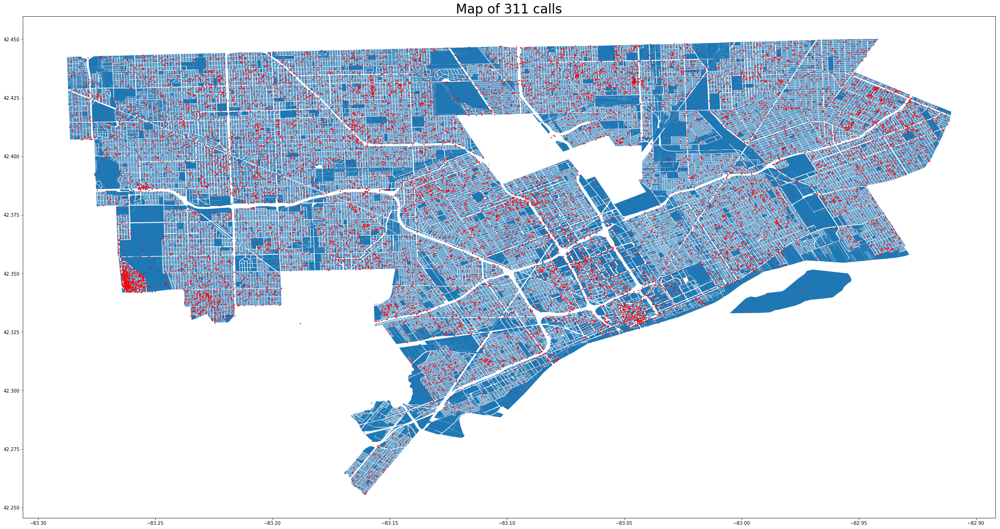

In [11]:
detroit_311_geo = detroit_311_geo[detroit_311_geo.lng > -84]
fig, ax = plt.subplots(1, figsize=(30, 20))
parcels.plot(ax=ax)
detroit_311_geo.plot(marker='o', markersize=2, color='r', ax=ax)
plt.title('Map of 311 calls', fontsize=28)
plt.tight_layout()
plt.show()


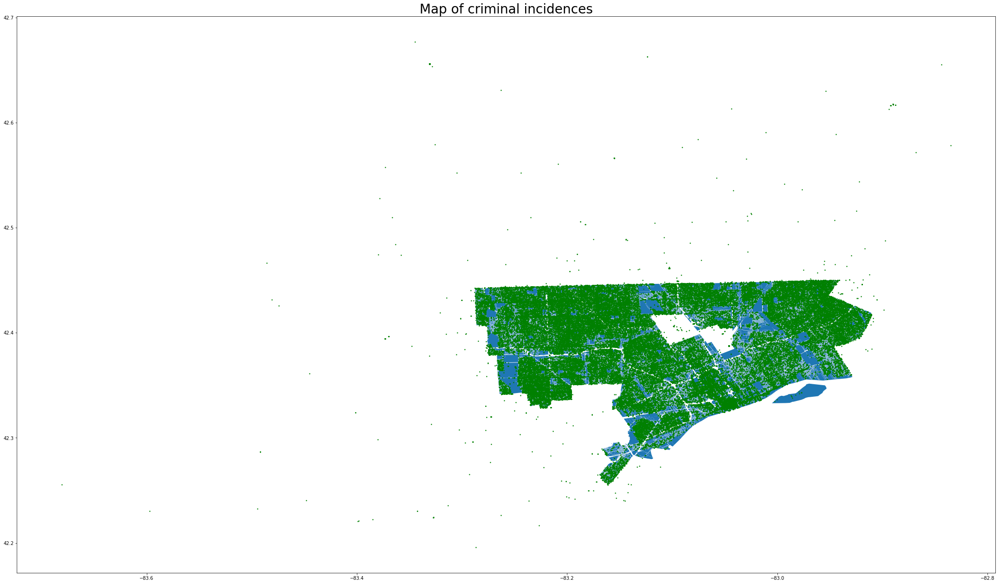

In [12]:
detroit_crime_geo = detroit_crime_geo[(detroit_crime_geo.LAT < 45) & (detroit_crime_geo.LAT > 42) & (detroit_crime_geo.LON > -84)]
fig, ax = plt.subplots(1, figsize=(30, 20))
parcels.plot(ax=ax)
detroit_crime_geo.plot(marker='o', markersize=2, color='g', ax=ax)
plt.title('Map of criminal incidences', fontsize=28)
plt.tight_layout()
plt.show()


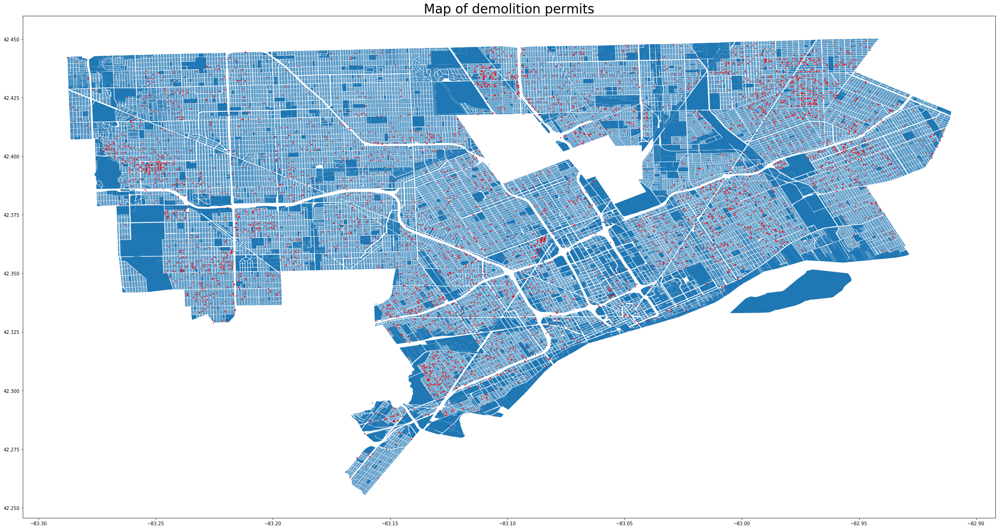

In [13]:
detroit_demolition_geo = detroit_demolition_geo[(detroit_demolition_geo.geometry.y < 45) & (detroit_demolition_geo.geometry.y > 42) & (detroit_demolition_geo.geometry.x > -84)]
fig, ax = plt.subplots(1, figsize=(30, 20))
parcels.plot(ax=ax)
detroit_demolition_geo.plot(marker='o', markersize=2, color='r', ax=ax)
plt.title('Map of demolition permits', fontsize=28)
plt.tight_layout()
plt.show()

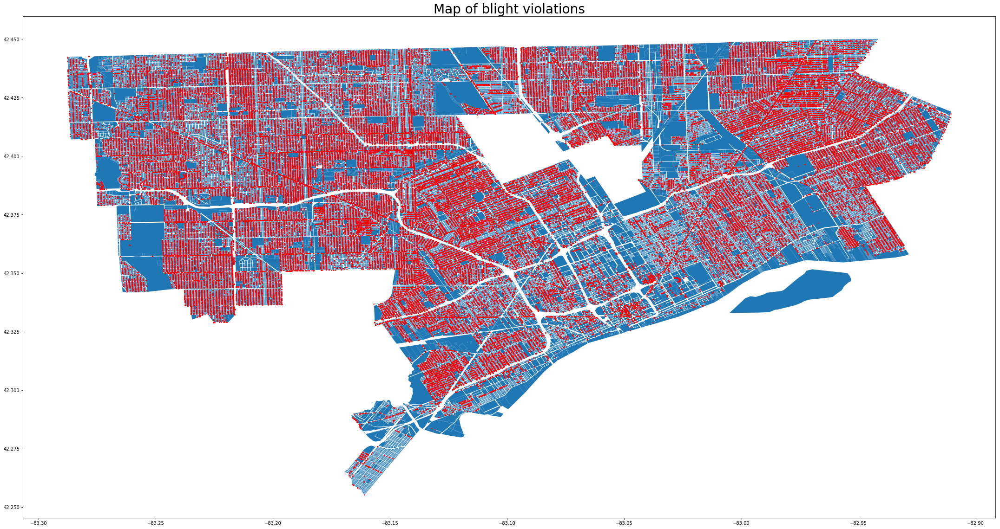

In [14]:
fig, ax = plt.subplots(1, figsize=(30, 20))
parcels.plot(ax=ax)
blight_violation_geo.plot(marker='o', markersize=2, color='r', ax=ax)
plt.title('Map of blight violations', fontsize=28)
plt.tight_layout()
plt.show()

In [15]:
def find_parcel(parcel_shape, coordinate):
    distance = np.inf
    ind = None
    for row in parcel_shape.itertuples():
        if row.geometry.intersects(coordinate):
            return (row.Index, 0.0)
        else :
            d = row.geometry.distance(coordinate)
            if d < distance:
                distance = d
                ind = row.Index
    return (ind, distance)

#for index, row in detroit_demolition_geo.iterrows():
#    c = row['geometry']
#    print(c)
#    print(find_parcel(parcels, c))
#parcels.head()

In [25]:
def create_parcel_labels(parcels, demolition):
    indexes = []
    labels = []
    distances, geometries = [], []
    nr = 0
    for ind, row in detroit_demolition_geo.iterrows():
        index, distance = find_parcel(parcels, row['geometry'])
        indexes.append(index)
        distances.append(distance)
        labels.append('blighted')
        geometries.append(parcels.loc[index, 'geometry'])
        nr += 1
        if nr % 100 == 0:
            print(nr)
        #if nr > 5:
        #    break
    n_labeled = len(indexes)
    print(n_labeled)
    while len(indexes) <= n_labeled*2:
        row = parcels.sample(n=1)
        if row.index[0] not in indexes:
            indexes.append(row.index[0])
            labels.append('not_blighted')
            distances.append(np.inf)
            geometries.append(row.iloc[0]['geometry'])
            #print(row.iloc[0]['geometry'])
            nr += 1
            if nr % 100 == 0:
                print(nr)
    return pd.DataFrame({'building_id': indexes, 'label': labels, 'distance_to_demolition': distances, 'geometry': geometries})

#df_labeled = create_parcel_labels(parcels, detroit_demolition_geo)
#df_labeled.to_csv('labeled_parcels.csv', index=False)
#df_labeled.head(10)

100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6315
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600


,building_id,label,distance_to_demolition,geometry
0,297006,blighted,0.000096,POLYGON ((-82.94792440439564 42.39400753780945...
1,78923,blighted,0.000055,POLYGON ((-83.00524924276517 42.39542916433345...
2,70557,blighted,0.000087,POLYGON ((-82.94695239706685 42.40308103260691...
3,142177,blighted,0.000078,POLYGON ((-82.94734929409513 42.44655887676704...
4,258115,blighted,0.000087,POLYGON ((-83.14794658269261 42.27715397455723...
5,190351,blighted,0.000103,POLYGON ((-82.94762640121048 42.40016816540834...
6,323618,blighted,0.000116,POLYGON ((-82.94892403890334 42.40211092693122...
7,356326,blighted,0.000116,POLYGON ((-82.94905470690898 42.40230834127835...
8,323618,blighted,0.000116,POLYGON ((-82.94892403890334 42.40211092693122...
9,40954,blighted,0.000091,POLYGON ((-82.93566853629528 42.36683261995794...
